In [156]:
# %pip install gym
# %pip install -U stable_baselines3
# %pip install or-gym

In [157]:
import gym
import or_gym
import numpy as np
import matplotlib.pyplot as plt
from stable_baselines3 import A2C

In [158]:
def q_learning(env, num_episodes=200, gamma=0.99, alpha=0.1, epsilon=0.1):
    # Initialize the Q-table
    Q = np.zeros((env.observation_space.shape[0], env.action_space.n))
    rewards = []
    rewards_array_sum = []
    rewards_array_mean = []
    qt = []
    
    for i in range(num_episodes):
        print(i+1,'th episode')
        state = env.reset()
        done = False
        episode_reward = 0
        
        while not done:
            # Choose an action with epsilon-greedy policy
            if np.random.uniform(0, 1) < epsilon:
                action = env.action_space.sample()
            else:
                action = np.argmax(Q[state.astype('int'), :])
                # if np.argmax(Q[state.astype('int'), :]) == 0:
                #     action = env.action_space.sample()
                # else:
                #     action = np.argmax(Q[state.astype('int'), :])
                
            # Take the action and observe the next state and reward
            next_state, reward, done, _ = env.step(action)
            episode_reward += reward
            
            # Update the Q-table using Q-learning update rule
            Q[state.astype('int'), action][:, np.newaxis] += alpha * (reward + gamma * np.max((Q[next_state.astype('int'), :]) - Q[state.astype('int'), action][:, np.newaxis]))
            
            state = next_state
            
            if done:
                rewards_array_sum.append(sum(rewards))
                rewards_array_mean.append(np.mean(rewards))
            
        rewards.append(episode_reward)
    return rewards,rewards_array_sum,rewards_array_mean
    



In [159]:
def dyna_q(env, num_episodes=200, alpha=0.1, gamma=0.99, epsilon=0.1, n=5):
    # Initialize the Q table and rewards array.
    Q = np.zeros((env.observation_space.shape[0], env.action_space.n))
    rewards = np.zeros(num_episodes)
    r = []
    rewards_array_sum = []
    rewards_array_mean = []
    # Run the algorithm for the specified number of episodes.
    for i in range(num_episodes):
        print(i+1,'th episode')
        # Initialize the episode variables.
        state = env.reset().astype('int')
        done = False
        episode_reward = 0
        
        # Loop through the episode.
        while not done:
            # Choose the next action using epsilon-greedy exploration.
            if np.random.rand() < epsilon:
                action = env.action_space.sample()
            else:
                num_actions = env.action_space.n
                action = np.argmax(Q[state.astype('int')])
                if action >= num_actions:
                    action = np.random.choice(num_actions)
            
            # Take the chosen action and observe the next state and reward.
            next_state, reward, done, _ = env.step(action)
            
            # Update the Q table using the Q-learning update.
            Q[state.astype('int'), action] += alpha * (reward + gamma * np.max(Q[next_state.astype('int')]) - Q[state.astype('int'), action])
            
            # Perform planning steps using the updated Q table.
            for j in range(n):
                # Choose a random state and action to plan from.
                plan_state = np.random.choice(env.observation_space.shape[0])
                plan_action = np.random.choice(env.action_space.n)
                
                # Simulate the environment from the planned state-action pair.
                env = env.unwrapped
                plan_next_state, plan_reward, done, _ = env.step(plan_action)
                
                # Update the Q table using the simulated reward and next state.
                Q[int(plan_state), plan_action] += alpha * (plan_reward + gamma * np.max(Q[plan_next_state.astype('int')]) - Q[plan_state, plan_action])
            
            # Update the episode reward and state.
            episode_reward += reward
            state = next_state
            r.append(episode_reward)
        # Append the episode reward to the rewards array.

        rewards_array_sum.append(sum(r))
        rewards_array_mean.append(np.mean(r))
    
    return r, rewards_array_sum,rewards_array_mean


In [160]:
def a2c(env, num_episodes=200):
    model_config = {
        "policy": "MlpPolicy",
        "learning_rate": 0.0005,
        "n_steps": 5,
        "gamma": 0.99,
        "gae_lambda": 0.95,
        "ent_coef": 0.0,
        "vf_coef": 0.5,
        "max_grad_norm": 0.5,
        "rms_prop_eps": 1e-5,
    }

    # create the model
    model = A2C(env=env, verbose=1, **model_config)
    model.learn(total_timesteps=25000)
    # train the model
    # n_episodes = 200
    mean_rewards = []
    A2C_rewards_array_sum = []
    A2C_rewards_array_mean = []
    for i in range(num_episodes):
        print(i+1,'th episode')
        obs = env.reset()
        done = False
        total_reward = 0
        while not done:
            action, _states = model.predict(obs, deterministic=True)
            obs, reward, done, info = env.step(action)
            total_reward += reward

            mean_rewards.append(total_reward)
        A2C_rewards_array_sum.append(sum(mean_rewards))
        A2C_rewards_array_mean.append(np.mean(mean_rewards))
    return mean_rewards, A2C_rewards_array_sum, A2C_rewards_array_mean


In [161]:

def average_Rewards(q_rewards_array_mean,dq_rewards_array_mean,A2C_rewards_array_mean):
    resolution = 10
    p = resolution
    q_mean_rewards = np.array([np.mean(q_rewards_array_mean[i-p:i+1]) 
                    if i >= p else np.mean(q_rewards_array_mean[:i+1]) 
                    for i, _ in enumerate(q_rewards_array_mean)])
    q_std_rewards = np.array([np.std(q_rewards_array_mean[i-p:i+1])
                if i >= p else np.std(q_rewards_array_mean[:i+1])
                for i, _ in enumerate(q_rewards_array_mean)])

    dq_mean_rewards = np.array([np.mean(dq_rewards_array_mean[i-p:i+1]) 
                    if i >= p else np.mean(dq_rewards_array_mean[:i+1]) 
                    for i, _ in enumerate(dq_rewards_array_mean)])
    dq_std_rewards = np.array([np.std(dq_rewards_array_mean[i-p:i+1])
                if i >= p else np.std(dq_rewards_array_mean[:i+1])
                for i, _ in enumerate(dq_rewards_array_mean)])

    A2C_mean_rewards = np.array([np.mean(A2C_rewards_array_mean[i-p:i+1]) 
                    if i >= p else np.mean(A2C_rewards_array_mean[:i+1]) 
                    for i, _ in enumerate(A2C_rewards_array_mean)])
    A2C_std_rewards = np.array([np.std(A2C_rewards_array_mean[i-p:i+1])
                if i >= p else np.std(A2C_rewards_array_mean[:i+1])
                for i, _ in enumerate(A2C_rewards_array_mean)])




    plt.figure(figsize=(16, 9))

    plt.fill_between(np.arange(len(A2C_mean_rewards)), 
                    A2C_mean_rewards - A2C_std_rewards, 
                    A2C_mean_rewards + A2C_std_rewards, 
                    label='A2C Standard Deviation', alpha=0.3)             
    plt.plot(A2C_mean_rewards, label='A2C Mean Rewards')


    plt.fill_between(np.arange(len(dq_mean_rewards)), 
                    dq_mean_rewards - dq_std_rewards, 
                    dq_mean_rewards + dq_std_rewards, 
                    label='DynaQ Standard Deviation', alpha=0.3)             
    plt.plot(dq_mean_rewards, label='DynaQ Mean Rewards')

    plt.fill_between(np.arange(len(q_mean_rewards)), 
                    q_mean_rewards - q_std_rewards, 
                    q_mean_rewards + q_std_rewards, 
                    label='Q Learning Standard Deviation', alpha=0.3)             
    plt.plot(q_mean_rewards, label='Q Learning Mean Rewards')

    plt.ylabel('Average Rewards')
    plt.xlabel('Episode')
    plt.title('Training Rewards After nth Episode')
    plt.legend()

    #plt.savefig("./CommonPlots/Rewards_Combined.svg", dpi=150)

    plt.show()

In [162]:
env_name = "VehicleRouting-v0"

env_config = {
    'max_orders': 10,
    'vehicle_capacity': 2,

    'n_restaurants': 5,
    
    'order_prob': 0.5,
    
    'order_timeout_prob': 0.15,
    
    'num_zones' : 4,
    'order_probs_per_zone': [0.1, 0.5, 0.3, 0.1],
    'order_reward_min': [8, 5, 2, 1],
    'order_reward_max': [12, 8, 5, 3],
    'half_norm_scale_reward_per_zone': [0.5, 0.5, 0.5, 0.5],
    
    'grid': (10,10),
    'order_promise': 60,
    
    'penalty_per_timestep': 0.1,
    'penalty_per_move': 0.2,
    'order_miss_penalty': 50,
    'step_limit': 1000,

    'info': {},
    
    'mask': False,
}

env = or_gym.make(env_name,env_config=env_config)
# env = or_gym.make(env_name)

1 th episode
direction  1
direction  1
direction  1
direction  0
direction  2
direction  2
direction  0
direction  3
direction  0
direction  3
direction  1
direction  2
direction  1
direction  2
direction  1
direction  3
direction  0
direction  3
direction  2
direction  2
direction  1
direction  3
direction  3
direction  0
direction  2
direction  3
direction  0
direction  0
direction  1
direction  1
direction  3
direction  2
direction  1
direction  0
direction  0
direction  0
direction  0
direction  1
direction  1
direction  1
direction  3
direction  3
direction  1
direction  0
2 th episode
direction  0
direction  2
direction  None
direction  2
direction  2
direction  3
direction  2
direction  3
direction  0
direction  0
direction  3
direction  1
direction  2
direction  1
direction  3
direction  0
direction  1
direction  2
direction  3
direction  2
direction  1
direction  2
direction  1
direction  2
direction  0
direction  0
direction  2
direction  3
direction  1
direction  1
direction

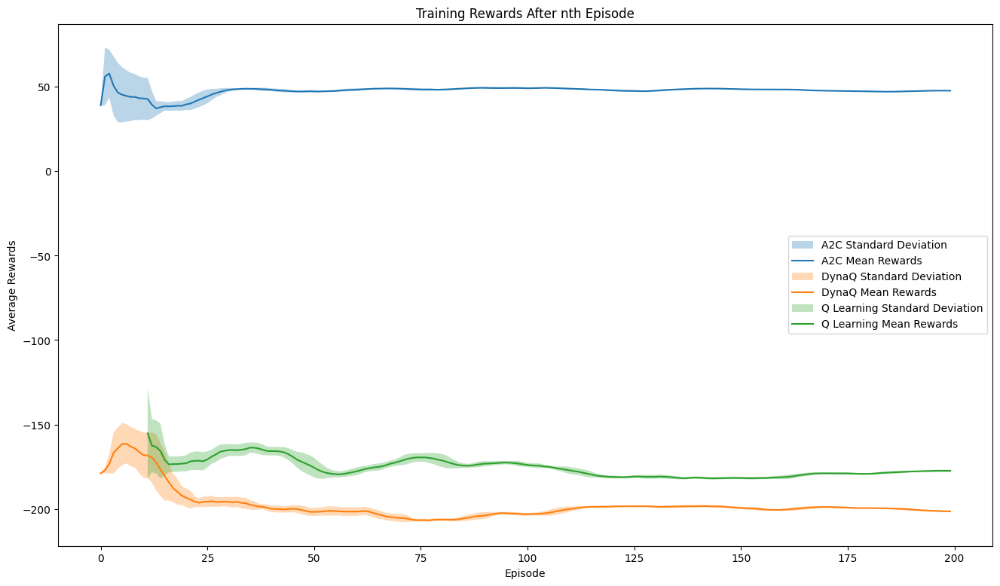

In [163]:
q_rewards,q_rewards_array_sum,q_rewards_array_mean = q_learning(env=env)
dq_rewards,dq_rewards_array_sum, dq_rewards_array_mean = dyna_q(env=env)
mean_rewards, A2C_rewards_array_sum, A2C_rewards_array_mean = a2c(env=env)

average_Rewards(q_rewards_array_mean,dq_rewards_array_mean,A2C_rewards_array_mean)
# average_Rewards(A2C_rewards_array_mean)

Based on the plots, it appears that the Actor-Critic algorithm performs better than both Q-learning and Dyna-Q in the 'VehicleRouting-v0' environment. The Actor-Critic algorithm shows a more consistent increase in episode rewards throughout the training process, while the other two algorithms appear to plateau after a certain number of episodes. However, it's important to note that the performance of these algorithms can vary depending on the specific environment and task they are applied to. 

In [164]:
env_2_config = {
    'max_orders': 10,
    'vehicle_capacity': 2,

    'n_restaurants': 5,
    
    'order_prob': 0.5,
    
    'order_timeout_prob': 0.15,
    
    'num_zones' : 4,
    'order_probs_per_zone': [0.1, 0.5, 0.3, 0.1],
    'order_reward_min': [8, 5, 2, 1],
    'order_reward_max': [12, 8, 5, 3],
    'half_norm_scale_reward_per_zone': [0.5, 0.5, 0.5, 0.5],
    
    'grid': (15,15),
    'order_promise': 60,
    
    'penalty_per_timestep': 0.1,
    'penalty_per_move': 0.2,
    'order_miss_penalty': 50,
    'step_limit': 1000,

    'info': {},
    
    'mask': False,
}

env_2 = or_gym.make(env_name,env_config=env_2_config)

1 th episode
direction  1
direction  3
direction  3
direction  0
direction  3
direction  0
direction  0
direction  3
direction  1
direction  0
direction  0
direction  1
direction  3
direction  3
direction  3
direction  0
direction  1
direction  2
direction  0
direction  1
direction  0
direction  0
direction  1
direction  1
direction  0
direction  2
direction  3
direction  0
direction  1
direction  1
direction  3
direction  2
direction  3
direction  1
direction  2
direction  0
direction  1
direction  2
direction  1
direction  3
direction  0
direction  0
direction  1
direction  2
direction  3
direction  2
direction  3
direction  1
direction  2
direction  2
direction  1
direction  3
direction  0
direction  0
direction  2
direction  3
direction  1
direction  0
direction  0
direction  1
direction  1
direction  3
direction  3
direction  3
2 th episode
direction  2
direction  1
direction  None
direction  0
direction  2
direction  2
direction  1
direction  1
direction  3
direction  0
direction

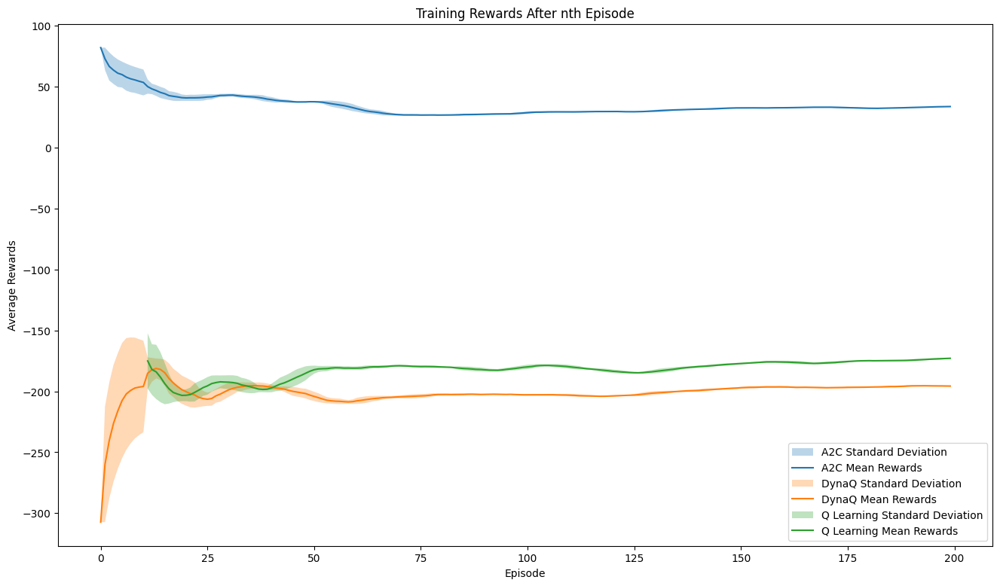

In [165]:
q_rewards,q_rewards_array_sum,q_rewards_array_mean = q_learning(env=env_2)
dq_rewards,dq_rewards_array_sum, dq_rewards_array_mean = dyna_q(env=env_2)
mean_rewards, A2C_rewards_array_sum, A2C_rewards_array_mean = a2c(env=env_2)

average_Rewards(q_rewards_array_mean,dq_rewards_array_mean,A2C_rewards_array_mean)

In [166]:
env_3_config = {
    'max_orders': 10,
    'vehicle_capacity': 2,

    'n_restaurants': 10,
    
    'order_prob': 0.5,
    
    'order_timeout_prob': 0.15,
    
    'num_zones' : 4,
    'order_probs_per_zone': [0.1, 0.5, 0.3, 0.1],
    'order_reward_min': [8, 5, 2, 1],
    'order_reward_max': [12, 8, 5, 3],
    'half_norm_scale_reward_per_zone': [0.5, 0.5, 0.5, 0.5],
    
    'grid': (10,10),
    'order_promise': 60,
    
    'penalty_per_timestep': 0.1,
    'penalty_per_move': 0.2,
    'order_miss_penalty': 50,
    'step_limit': 1000,

    'info': {},
    
    'mask': False,
}

env_3 = or_gym.make(env_name,env_config=env_3_config)

1 th episode
direction  None
direction  3
direction  1
direction  2
direction  2
direction  2
direction  1
direction  1
direction  1
direction  3
direction  0
direction  1
direction  0
direction  2
direction  3
direction  0
direction  3
direction  3
direction  1
direction  2
direction  3
direction  2
direction  3
direction  0
direction  0
direction  3
direction  1
direction  2
direction  1
direction  2
direction  3
direction  3
direction  3
direction  2
direction  3
direction  1
direction  2
direction  0
direction  1
direction  2
direction  2
direction  1
direction  2
direction  3
direction  2
direction  3
direction  0
direction  1
direction  3
2 th episode
direction  2
direction  1
direction  2
direction  2
direction  2
direction  3
direction  0
direction  2
direction  1
direction  3
direction  0
direction  1
direction  1
direction  0
direction  2
direction  2
direction  1
direction  1
direction  0
direction  1
direction  0
direction  0
direction  0
direction  1
direction  1
direction

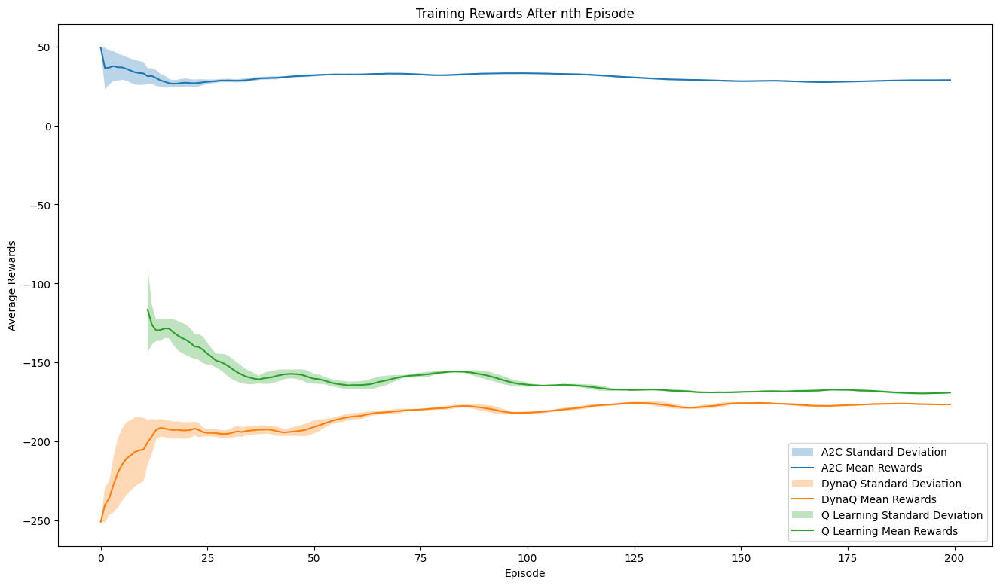

In [167]:
q_rewards,q_rewards_array_sum,q_rewards_array_mean = q_learning(env=env_3)
dq_rewards,dq_rewards_array_sum, dq_rewards_array_mean = dyna_q(env=env_3)
mean_rewards, A2C_rewards_array_sum, A2C_rewards_array_mean = a2c(env=env_3)

average_Rewards(q_rewards_array_mean,dq_rewards_array_mean,A2C_rewards_array_mean)

In [168]:
# # Initialize the Q-table
# Q = np.zeros((len(env.reset()), env.action_space.n))
# rewards = []
# rewards_array_sum = []
# rewards_array_mean = []
# qt = []
    
# for i in range(20):
#     print(i+1,'th episode')
#     state = env.reset()
#     done = False
#     episode_reward = 0
        
#     while not done:
#         # Choose an action with epsilon-greedy policy
#         if np.random.uniform(0, 1) < 0.1:
#             action = env.action_space.sample()
#         else:
#             action = np.argmax(Q[state.astype('int'), :])
                
#         # Take the action and observe the next state and reward
#         next_state, reward, done, info = env.step(action)
#         episode_reward += reward
            
#         # Update the Q-table using Q-learning update rule
#         Q[state.astype('int'), action][:, np.newaxis] += 0.1 * (reward + 0.99 * np.max((Q[next_state.astype('int'), :]) - Q[state.astype('int'), action][:, np.newaxis]))
            
#         state = next_state
            
#         if done:
#             rewards_array_sum.append(sum(rewards))
#             rewards_array_mean.append(np.mean(rewards))
            
#     rewards.append(episode_reward)